<a href="https://colab.research.google.com/github/OssamaChrifi/Video_classification_stage/blob/main/RGB%2BCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 align="center"><font size="5">Machine learning algorithm classification</font></h1>

<img src="https://www.luisllamas.es/wp-content/uploads/2019/02/tensorflowkeras.png" width="400px" align="center">

* Get to know Machine Learning and TensorFlow framework
* Learn how to classify database using algorithm methode

A video is a set of images scrolled at a rapid time. So to classify a video it looks like classifying an image but with a set of images. For that we will importe dataset, build our own model, train the model and evaluate our model.

#Importe Library

In [ ]:
import cv2
import os
import math   # for mathematical operations
import matplotlib.pyplot as plt    # for plotting the images
import matplotlib.image as image
%matplotlib inline
import pandas as pd
from keras.preprocessing import image   # for preprocessing the images
import numpy as np    # for mathematical operations
from keras.utils import np_utils
from skimage.transform import resize   # for resizing images
from sklearn.model_selection import train_test_split
from glob import glob
from tqdm import tqdm

#Build model architecture
import keras
from keras.models import Sequential
from keras.layers import Dense, InputLayer, Dropout, Flatten
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Import video 

we import our video in format mp4 downloded in the drive

In [ ]:
## for short videos
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/drive/MyDrive/Colab Notebooks/Machine learning classification/La1HD_0004.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

split the video on frames of images and convert the space of color to YCrCb

In [ ]:
try :
    os.mkdir('info')
    vidcap = cv2.VideoCapture('/content/drive/MyDrive/Colab Notebooks/Machine learning classification/La1HD_0004.mp4')
    success,image1 = vidcap.read()
    count = 0
    while success:
      image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2YCrCb)
      cv2.imwrite('info/news%d.jpg' % count, image1)     # save frame as JPEG file      
      success,image1 = vidcap.read()

      count += 1

    print('%d images are save in JPEG format' % count)
except :
    print('images already saved')

377 images are save in JPEG format


record the frames of images in folder info which is the label of this video

In [ ]:
from logging import exception
path1 = '/content/drive/MyDrive/Colab Notebooks/Machine learning classification/archive/testing_set/news'
path2 = '/content/drive/MyDrive/Colab Notebooks/Machine learning classification/archive/training_set/news'
try :
    os.mkdir(path1)
    os.mkdir(path2)
except :
    print('file already exist')

if os.listdir(path1) == [] :
    for i in tqdm(range(len(os.listdir('info')))) :
        img = cv2.imread('/content/info/' + os.listdir('info')[i])
        if i <=  int(len(os.listdir('info'))*0.8) :s
            cv2.imwrite(path2 + '/' + os.listdir('info')[i] ,img)
            cv2.destroyAllWindows
        else :
            cv2.imwrite(path1 + '/' + os.listdir('info')[i], img)
            cv2.destroyAllWindows
else : 
      print('images already extract')

# Data preparation

In [ ]:
path_testing_set = '/content/drive/MyDrive/Colab Notebooks/Machine learning classification/archive/testing_set'
path_training_set = '/content/drive/MyDrive/Colab Notebooks/Machine learning classification/archive/training_set'
Categories_all = os.listdir(path_testing_set)
Categories = Categories_all[-4:]
print(Categories)

['golf_swing', 'biking', 'basketball', 'news']


# Hyperparameter

In [ ]:
epochs = 20
batch_size = 32

# Extract feature

split all videos from the database UCF11 to frames of images and convert the color space to YCbCr

In [ ]:
if  len(os.listdir('/content/drive/MyDrive/Colab Notebooks/Machine learning classification/archive')) == 2 :
    for category in Categories_all :
      image_paths = [path_training_set + '/' + category + '/' + n for n in os.listdir(path_training_set + '/' + category)[:int(len(os.listdir(path_training_set + '/' + category))*0.4)] if n[-4:] == '.jpg']
      for i in range(len(image_paths)) : 
        image = cv2.imread(image_paths[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
        cv2.imwrite(image_paths[i], image)
        cv2.destroyAllWindows()


    for category in Categories_all :
      image_paths = [path_testing_set + '/' + category + '/' + n for n in os.listdir(path_testing_set + '/' + category)[:int(len(os.listdir(path_testing_set + '/' + category))*0.4)] if n[-4:] == '.jpg']
      for i in range(len(image_paths)) : 
        image = cv2.imread(image_paths[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
        cv2.imwrite(image_paths[i], image)
        cv2.destroyAllWindows()


    os.mkdir('/content/drive/MyDrive/Colab Notebooks/Machine learning classification/archive/error')
else :
    print('color space of images is already YCbCr')

color space of images is already YCbCr


save the path of images of each categories in table

In [ ]:
images = []
for category in Categories :
  image_paths = [path_training_set + '/' + category + '/' + n for n in os.listdir(path_training_set + '/' + category) if n[-4:] == '.jpg']
  images.append(image_paths)


Once the frames are extracted, we will save the name of these frames with their corresponding tag in a .csv file. Creating this file will help us to read the frames which we will see in the next section.

In [ ]:
train_image = []
train_class = []
for i in tqdm(range(len(images))):
    # creating the image name
    for x in range(len(images[i])) : 
      train_image.append(images[i][x].split('/')[9])
      train_class.append(images[i][x].split('/')[8])
    
# storing the images and their class in a dataframe
train_data = pd.DataFrame()
train_data['image'] = train_image
train_data['class'] = train_class

# converting the dataframe into csv file 
train_data.to_csv('UCF_train_new.csv',header=True, index=False)

100%|██████████| 4/4 [00:00<00:00, 557.55it/s]


In [ ]:
train = pd.read_csv('/content/UCF_train_new.csv')
train.head()

,image,class
0,frame_520.jpg,golf_swing
1,frame_509.jpg,golf_swing
2,frame_517.jpg,golf_swing
3,frame_502.jpg,golf_swing
4,frame_508.jpg,golf_swing


This is how the first five rows look like. We have the corresponding class or tag for each frame

#Training the Video Classification Model
I have divided this step into sub-steps for ease of understanding:

Read all the frames that we extracted earlier for the training images
Create a validation set which will help us examine how well our model will
perform on unseen data
Define the architecture of our model
Finally, train the model and save its weights

Now, using this .csv file, we will read the frames that we extracted earlier and then store those frames as a NumPy array:

In [ ]:
# creating an empty list
train_image = []

# for loop to read and store frames
for i in tqdm(range(train.shape[0])):
    # loading the image and keeping the target size as (224,224,3)
    img = image.load_img(path_training_set + '/' + train['class'][i] + '/' + train['image'][i], target_size=(224,224,3))
    # converting it to array
    img = image.img_to_array(img)
    # normalizing the pixel value
    img = img/255
    # appending the image to the train_image list
    train_image.append(img)
    
# converting the list to numpy array
train_image = np.array(train_image)

# shape of the array
train_image.shape

100%|██████████| 4802/4802 [15:07<00:00,  5.29it/s]


(4802, 224, 224, 3)

We have 4802 images with a dimmension 224x224x3 in our trainning set

# Creating a validation set

To create the validation set, we need to make sure that the distribution of each class is similar in both training and validation sets. We can use the stratify parameter to do that:

In [ ]:
# separating the target
y = train['class']

# creating the training and validation set
X_train, X_test, y_train, y_test = train_test_split(train_image, y, random_state=42, test_size=0.2, stratify = y)

there are 11 categories in which a video can be classified. So, we will have to create 11 different columns in the target, one for each category. We will use the get_dummies() function for that:

In [ ]:
# creating dummies of target variable for train and validation set
y_train = pd.get_dummies(y_train)
y_test = pd.get_dummies(y_test)

# Defining the architecture of the video classification model

ince we do not have a very large dataset, creating a model from scratch might not work well. So, we will use a pre-trained model and take its learnings to solve our problem.

For this particular dataset, we will be using the VGG-16 pre-trained model. Let’s create a base model of the pre-trained model and we will extract features from this pre-trained model for our training and validation images:

In [ ]:
from keras.applications.vgg16 import VGG16

# creating the base model of pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=False)

# extracting features for training frames
X_train = base_model.predict(X_train)
print(X_train.shape)

# extracting features for training frames
X_test = base_model.predict(X_test)
print(X_test.shape)

58900480/58889256 [==============================] - 1s 0us/step
(3841, 7, 7, 512)
(961, 7, 7, 512)


We have 3841 images in the training set and the shape has been changed to (7, 7, 512) since we have passed these images through the VGG16 architecture. Similarly, we will extract features for validation frames and we have 961 images
with (7,7,512) dimensions

# Classification model

After we extract feature we need to reshape our data to feed the LSTM model and then we normalize the pixel which will increase the speed of calculation or convergence.

In [ ]:
# reshaping the training as well as validation frames in single dimension
X_train = X_train.reshape(X_train.shape[0],1 ,X_train.shape[1]*X_train.shape[2]*X_train.shape[3])
X_test = X_test.reshape(X_test.shape[0],1 ,X_test.shape[1]*X_test.shape[2]*X_test.shape[3])

# normalizing the pixel values
max = X_train.max()
X_train = X_train/max
X_test = X_test/max
# shape of images
X_train.shape
X_test.shape

#LSTM classification model
LSTM_model = Sequential()
LSTM_model.add(LSTM(150, activation = 'relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
LSTM_model.add(LSTM(150, activation = 'relu'))
LSTM_model.add(Dropout(0.5))
LSTM_model.add(Flatten())
LSTM_model.add(Dense(100, activation='relu'))
LSTM_model.add(Dense(len(Categories), activation='softmax'))

# defining a function to save the weights of best model
from keras.callbacks import ModelCheckpoint
mcp_save = ModelCheckpoint('/content/weight.hdf5', save_best_only=True, monitor='val_loss', mode='min')

# compiling the model
LSTM_model.compile(loss='categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])

# training the model
history = LSTM_model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test), callbacks=[mcp_save], batch_size=batch_size)

Epoch 1/20
121/121 [==============================] - 25s 176ms/step - loss: 0.6492 - accuracy: 0.7095 - val_loss: 0.1260 - val_accuracy: 0.9615
Epoch 2/20
121/121 [==============================] - 19s 160ms/step - loss: 0.0617 - accuracy: 0.9800 - val_loss: 0.0736 - val_accuracy: 0.9813
Epoch 3/20
121/121 [==============================] - 19s 159ms/step - loss: 0.0504 - accuracy: 0.9826 - val_loss: 0.0404 - val_accuracy: 0.9886
Epoch 4/20
121/121 [==============================] - 19s 158ms/step - loss: 0.0176 - accuracy: 0.9951 - val_loss: 0.0209 - val_accuracy: 0.9958
Epoch 5/20
121/121 [==============================] - 18s 145ms/step - loss: 0.0135 - accuracy: 0.9961 - val_loss: 0.0231 - val_accuracy: 0.9958
Epoch 6/20
121/121 [==============================] - 19s 158ms/step - loss: 0.0050 - accuracy: 0.9992 - val_loss: 0.0188 - val_accuracy: 0.9948
Epoch 7/20
121/121 [==============================] - 17s 141ms/step - loss: 0.0036 - accuracy: 0.9990 - val_loss: 0.0255 - val_ac

We have multiple fully connected dense layers. I have added dropout layers as well so that the model will not overfit. The number of neurons in the final layer is equal to the number of classes that we have and hence the number of neurons here is 12.

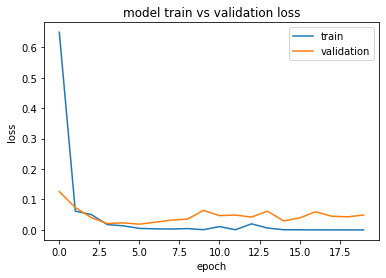

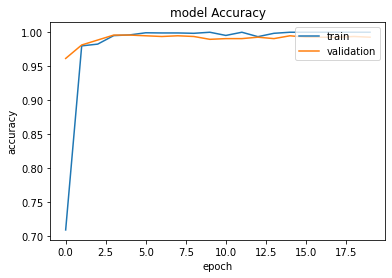

In [ ]:
from matplotlib import pyplot

# plot train and validation loss
pyplot.plot(history.history['loss'])
pyplot.plot(history.history['val_loss'])
pyplot.title('model train vs validation loss')
pyplot.ylabel('loss')
pyplot.xlabel('epoch')
pyplot.legend(['train', 'validation'], loc='upper right')
pyplot.show()

# plot train and validation accuracy
pyplot.plot(history.history['accuracy'])
pyplot.plot(history.history['val_accuracy'])
pyplot.title('model Accuracy')
pyplot.ylabel('accuracy')
pyplot.xlabel('epoch')
pyplot.legend(['train', 'validation'], loc='upper right')
pyplot.show()

We now have the weights which we will use to make predictions for the new videos. So, in the next section, we will see how well this model will perform on the task of video classification!

#Evaluating our Video Classification Model
The evaluation part can also be split into multiple steps to understand the process more clearly:

Define the model architecture and load the weights
Create the test data
Make predictions for the test videos
Finally, evaluate the model
#Defining model architecture and loading weights

In [ ]:
images = []
for category in Categories :
  image_paths = [path_testing_set + '/' + category + '/' + n for n in os.listdir(path_testing_set + '/' + category) if n[-4:] == '.jpg']
  images.append(image_paths)


In [ ]:
test_image = []
test_class = []
for i in tqdm(range(len(images))):
    # creating the image name
    for x in range(len(images[i])) : 
      test_image.append(images[i][x].split('/')[9])
      test_class.append(images[i][x].split('/')[8])
    
# storing the images and their class in a dataframe
test_data = pd.DataFrame()
test_data['image'] = test_image
test_data['class'] = test_class

100%|██████████| 4/4 [00:00<00:00, 2972.58it/s]


In [ ]:
# creating the tags
train = pd.read_csv('/content/UCF_train_new.csv')
y = train['class']
y = pd.get_dummies(y)

In [ ]:
print(y)

      basketball  biking  golf_swing  news
0              0       0           1     0
1              0       0           1     0
2              0       0           1     0
3              0       0           1     0
4              0       0           1     0
...          ...     ...         ...   ...
4797           0       0           0     1
4798           0       0           0     1
4799           0       0           0     1
4800           0       0           0     1
4801           0       0           0     1

[4802 rows x 4 columns]


Now, we will make predictions for the videos in the test set.

 
#Generating predictions for test videos

the prediction part:

* First, we will create two empty lists – one to store the predictions and the other to store the actual tags
* Then, we will take each video from the test set, extract frames for this video and store it in a folder (create a folder named temp in the current directory to store the frames). We will remove all the other files from this folder at each iteration
* Next, we will read all the frames from the temp folder, extract features for these frames using the pre-trained model, predict tags, and then take the mode to assign a tag for that particular video and append it in the list
* We will append actual tags for each video in the second list

In [ ]:
from scipy import stats as s

# creating two lists to store predicted and actual tags
predict = []
actual = []

# for loop to extract frames from each test video
for i in tqdm(range(len(test_image))): 
    # reading all the frames from temp folder
    prediction_images = []
    img = image.load_img(path_testing_set + '/' + test_class[i] + '/' + test_image[i], target_size=(224,224,3))
    img = image.img_to_array(img)
    img = img/255
    prediction_images.append(img)       
    # converting all the frames for a test video into numpy array
    prediction_images = np.array(prediction_images)
    # extracting features using pre-trained model
    prediction_images = base_model.predict(prediction_images)
    # converting features in one dimensional array
    prediction_images = prediction_images.reshape(prediction_images.shape[0], 1, prediction_images.shape[1]*prediction_images.shape[2]*prediction_images.shape[3])
    #we use our model to have the probability vectors for each images
    prediction = LSTM_model.predict(prediction_images)
    # predicting tags for each array
    prediction=np.argmax(prediction,axis=1)
    # appending the mode of predictions in predict list to assign the tag to the video
    predict.append(y.columns.values[s.mode(prediction)[0][0]])
    # appending the actual tag of the video
    actual.append(test_class[i])

100%|██████████| 525/525 [07:46<00:00,  1.13it/s]


In [ ]:
# checking the accuracy of the predicted tags
from sklearn.metrics import accuracy_score
accuracy_score(predict, actual)*100

99.04761904761905

In [ ]:
# creating two lists to store predicted and actual tags
predict = []
actual = []
    
# reading all the frames from temp folder
images = glob("/content/info/*.jpg")
prediction_images = []
for i in range(len(images)):
    img = image.load_img(images[i], target_size=(224,224,3))
    img = image.img_to_array(img)
    img = img/255
    prediction_images.append(img)
        
# converting all the frames for a test video into numpy array
prediction_images = np.array(prediction_images)
# extracting features using pre-trained model
prediction_images = base_model.predict(prediction_images)
# converting features in one dimensional array
prediction_images = prediction_images.reshape(prediction_images.shape[0], 1, prediction_images.shape[1]*prediction_images.shape[2]*prediction_images.shape[3])
#we use our model to have the probability vectors for each images
prediction_proba = LSTM_model.predict(prediction_images)
# predicting tags for each array
prediction=np.argmax(prediction_proba,axis=1)
# appending the mode of predictions in predict list to assign the tag to the video
predict.append(y.columns.values[s.mode(prediction)[0][0]])
# appending the actual tag of the video
actual.append('news')

In [ ]:
print('video_class :', actual)

print('prediction :', predict)


video_class : ['news']
prediction : ['news']
